<a href="https://colab.research.google.com/github/remijul/tutorial/blob/master/Supervised_ML_Classification_Sentiment_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Supervised ML - Classification of Airline Passengers Satisfaction

---


# Goals :
This notebook proposes a structured way to develop a ML Supervised project.
The objective is to model and predict the airline passenger satisfaction from a set of different features (travel, comfort, etc.).
The ML project is achieved as following :
- EDA - Exploratory Data Analysis
- Data preprocessing & Pipeline, with sklearn
- Model training & GridSearchCV, with sklearn
- Extensive search of hyperparameters, with sklearn
- Use of dedicated classification metrics
- Comparison & Selection of a set of models
- Prediction on new data
- Conclusions

## 1 Import libraries

In [ ]:
# Data
import pandas as pd
import numpy as np

# Graphics
import seaborn as sns ; sns.set()
import matplotlib.pyplot as plt
import plotly.express as px

# Utils
from time import perf_counter

# PCA
from sklearn.decomposition import PCA

# Machine learning - Preprocessing
from sklearn.preprocessing import scale, LabelEncoder, OneHotEncoder, RobustScaler, MinMaxScaler, QuantileTransformer
from sklearn.impute import KNNImputer, SimpleImputer
from sklearn.compose import ColumnTransformer

# Machine learning - Automatisation
from sklearn.pipeline import Pipeline
from sklearn import set_config

# Machine learning - Models
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, HistGradientBoostingClassifier
from sklearn.decomposition import PCA
from sklearn.naive_bayes import GaussianNB

# Machine learning - Model selection
from sklearn.experimental import enable_halving_search_cv # noqa
from sklearn.model_selection import train_test_split, GridSearchCV, HalvingGridSearchCV

# Machine learning - Metrics
from sklearn import metrics
from sklearn.metrics import confusion_matrix, accuracy_score, ConfusionMatrixDisplay, f1_score, fbeta_score, make_scorer #plot_confusion_matrix,

## 2 Import dataset
The dataset relates to a survey conducted by airlines on the satisfaction level of passengers/customers based on various factors.
The dataset consists in 25 columns such as `Age`, `Gender`, `Travel class`, `Arrival delay` and `Departure delay` and also features that influences customer satisfaction level such as `On-board service`, `Cleanliness`, `Seat comfort`, `Baggage handling` etc.
* target is then the `Satisfaction` column
* and features (numerical or categorical) are all other columns

The dataset is available on [Github](https://github.com/remijul/dataset/blob/master/Airline%20Passenger%20Satisfaction.csv) and [here](https://github.com/remijul/dataset/blob/master/Airline%20passenger%20satisfaction_info.txt) is the data dictionary.




In [ ]:
import pandas as pd
url = "https://raw.githubusercontent.com/remijul/dataset/master/Airline%20Passenger%20Satisfaction.csv"
df = pd.read_csv(url, sep=";")
df.head()

,id,Satisfaction,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Seat comfort,Departure/Arrival time convenient,...,Online support,Ease of Online booking,On-board service,Leg room service,Baggage handling,Checkin service,Cleanliness,Online boarding,Departure Delay in Minutes,Arrival Delay in Minutes
0,11112,satisfied,Female,Loyal Customer,65,Personal Travel,Eco,265,0,0,...,2,3,3,0,3,5,3,2,0,0.0
1,110278,satisfied,Male,Loyal Customer,47,Personal Travel,Business,2464,0,0,...,2,3,4,4,4,2,3,2,310,305.0
2,103199,satisfied,Female,Loyal Customer,15,Personal Travel,Eco,2138,0,0,...,2,2,3,3,4,4,4,2,0,0.0
3,47462,satisfied,Female,Loyal Customer,60,Personal Travel,Eco,623,0,0,...,3,1,1,0,1,4,1,3,0,0.0
4,120011,satisfied,Female,Loyal Customer,70,Personal Travel,Eco,354,0,0,...,4,2,2,0,2,4,2,5,0,0.0


## 3 EDA - Exploratory Data Analysis

### 3.1 Basic description of dataset

Dimensions of dataset.

In [ ]:
df.shape

(129880, 24)

Name and data types of all columns.

In [ ]:
df.dtypes

id                                     int64
Satisfaction                          object
Gender                                object
Customer Type                         object
Age                                    int64
Type of Travel                        object
Class                                 object
Flight Distance                        int64
Seat comfort                           int64
Departure/Arrival time convenient      int64
Food and drink                         int64
Gate location                          int64
Inflight wifi service                  int64
Inflight entertainment                 int64
Online support                         int64
Ease of Online booking                 int64
On-board service                       int64
Leg room service                       int64
Baggage handling                       int64
Checkin service                        int64
Cleanliness                            int64
Online boarding                        int64
Departure 

Some Information on the dataset.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129880 entries, 0 to 129879
Data columns (total 24 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   id                                 129880 non-null  int64  
 1   Satisfaction                       129880 non-null  object 
 2   Gender                             129880 non-null  object 
 3   Customer Type                      129880 non-null  object 
 4   Age                                129880 non-null  int64  
 5   Type of Travel                     129880 non-null  object 
 6   Class                              129880 non-null  object 
 7   Flight Distance                    129880 non-null  int64  
 8   Seat comfort                       129880 non-null  int64  
 9   Departure/Arrival time convenient  129880 non-null  int64  
 10  Food and drink                     129880 non-null  int64  
 11  Gate location                      1298

Last instruction returns an useful information : the column `Arrival Delay in Minutes` get some missing values. But how many ?

In [ ]:
df['Arrival Delay in Minutes'].isna().sum()

393

### 3.2 Univariate analysis
Statistical description column by column.

#### 3.2.1 On the target

In [ ]:
print('In count:\n' , df['Satisfaction'].value_counts())
print('In proportion:\n' , df['Satisfaction'].value_counts(normalize=True))

In count:
 satisfied                  71087
neutral or dissatisfied    58793
Name: Satisfaction, dtype: int64
In proportion:
 satisfied                  0.547328
neutral or dissatisfied    0.452672
Name: Satisfaction, dtype: float64


So, the target is slightly unbalanced since 55% of `Satisfaction` is labeled `satisfied`.
However the dataset includes a lot of labels `neutral or dissatisfied`, then the ML models should have enough examples to build its training and fit to data.

#### 3.2.2 On numerical data

In [ ]:
df.describe()

,id,Age,Flight Distance,Seat comfort,Departure/Arrival time convenient,Food and drink,Gate location,Inflight wifi service,Inflight entertainment,Online support,Ease of Online booking,On-board service,Leg room service,Baggage handling,Checkin service,Cleanliness,Online boarding,Departure Delay in Minutes,Arrival Delay in Minutes
count,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129487.000000
mean,64940.500000,39.427957,1981.409055,2.838597,2.990645,2.851994,2.990422,3.249130,3.383477,3.519703,3.472105,3.465075,3.485902,3.695673,3.340807,3.705759,3.352587,14.713713,15.091129
std,37493.270818,15.119360,1027.115606,1.392983,1.527224,1.443729,1.305970,1.318818,1.346059,1.306511,1.305560,1.270836,1.292226,1.156483,1.260582,1.151774,1.298715,38.071126,38.465650
min,1.000000,7.000000,50.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,32470.750000,27.000000,1359.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,2.000000,3.000000,2.000000,3.000000,3.000000,3.000000,2.000000,0.000000,0.000000
50%,64940.500000,40.000000,1925.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,4.000000,0.000000,0.000000
75%,97410.250000,51.000000,2544.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,5.000000,4.000000,5.000000,5.000000,4.000000,5.000000,4.000000,12.000000,13.000000
max,129880.000000,85.000000,6951.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1592.000000,1584.000000


The above description shows some fruitful information. All numerical features don't share the same distribution.
More investigations are needed as follow, considering that some features are numerical but look like ordinal data.

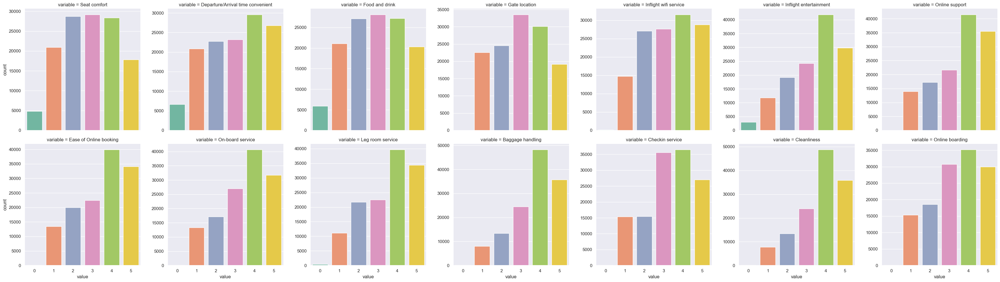

In [ ]:
# Data prep : reshaping dataframe for graphical convenience (seaborn grid plot)
df_melt = df.select_dtypes(exclude='object').drop(columns=['id', 'Age', 'Flight Distance', 'Departure Delay in Minutes', 'Arrival Delay in Minutes']).melt()

# Plotting
sns.catplot(
    data=df_melt, x='value',
    sharex=True, sharey=False, col='variable', kind='count', col_wrap=7, palette="Set2"
)

#### 3.2.3 On categorical data

In [ ]:
df.describe(include='object')

,Satisfaction,Gender,Customer Type,Type of Travel,Class
count,129880,129880,129880,129880,129880
unique,2,2,2,2,3
top,satisfied,Female,Loyal Customer,Business travel,Business
freq,71087,65899,106100,89693,62160


Categorial data includes a few of different values.
So, the one-hot-encoding step should leads to a few of new columns.

In [ ]:
df.groupby('Satisfaction').count()

,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Seat comfort,Departure/Arrival time convenient,Food and drink,...,Online support,Ease of Online booking,On-board service,Leg room service,Baggage handling,Checkin service,Cleanliness,Online boarding,Departure Delay in Minutes,Arrival Delay in Minutes
Satisfaction,,,,,,,,,,,,,,,,,,,,,
neutral or dissatisfied,58793,58793,58793,58793,58793,58793,58793,58793,58793,58793,...,58793,58793,58793,58793,58793,58793,58793,58793,58793,58605
satisfied,71087,71087,71087,71087,71087,71087,71087,71087,71087,71087,...,71087,71087,71087,71087,71087,71087,71087,71087,71087,70882


#### 3.2.4 Conclusions

The above descriptions show some fruitful information :
- Numerical features such as `Age`, `Flight Distance`, `Departure Delay in Minutes`, `Arrival Delay in Minutes` are continuous data but distributions have different patterns. So,
  - `Age` and `Flight Distance` may be scaled with with the `StandardScaler()`.
  - `Departure Delay in Minutes`, `Arrival Delay in Minutes` may be scaled with with the `QuantileTransformer()`.
- The other numerical features such as `Seat comfort`, `Food and drink` are some ordinal data. Those features may be scaled with the `MinMaxScaler()` or possibly not scaled as well.
- The categorical data may be encoded with the `OneHotEncoder()`.


### 3.3 Bivariate analysis - Numerical features

#### 3.3.1 Boxplot - One feature Vs Target

<Axes: xlabel='Age', ylabel='Satisfaction'>

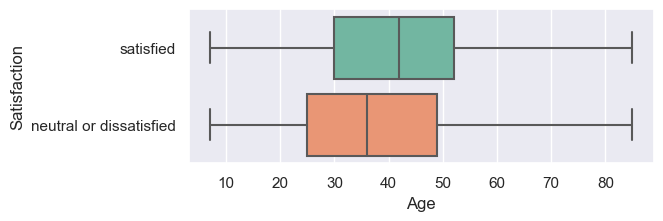

In [ ]:
plt.subplots(figsize=(6, 2))
sns.boxplot(data=df, x='Age', y="Satisfaction", orient="h", palette="Set2")

#### 3.3.2 Boxplot - Multiple features Vs Target

In [ ]:
# Data prep : reshaping dataframe for graphical convenience (seaborn grid plot)
df_melt = df[['Satisfaction', 'Age', 'Flight Distance', 'Seat comfort', 'Arrival Delay in Minutes']].melt(id_vars='Satisfaction')
df_melt.head(3)

,Satisfaction,variable,value
0,satisfied,Age,65.0
1,satisfied,Age,47.0
2,satisfied,Age,15.0


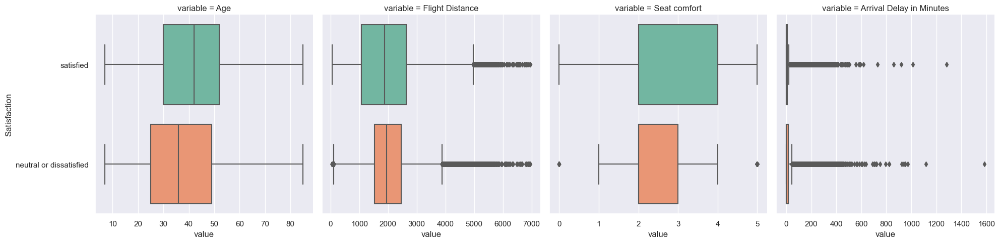

In [ ]:
#plt.subplots(figsize=(12, 10))
sns.catplot(
    data=df_melt, y='Satisfaction', x='value',
    sharex=False, col='variable', kind='box', col_wrap=4, palette="Set2"
)

#### 3.3.3 Histogram - Multiple features Vs Target

Distribution of 4 numerical features against the `satisfaction` labels.

C:\Users\RémiJulien\AppData\Local\Temp\ipykernel_44692\3200738268.py:4: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot(2,2,1)


<Axes: xlabel='Arrival Delay in Minutes', ylabel='Count'>

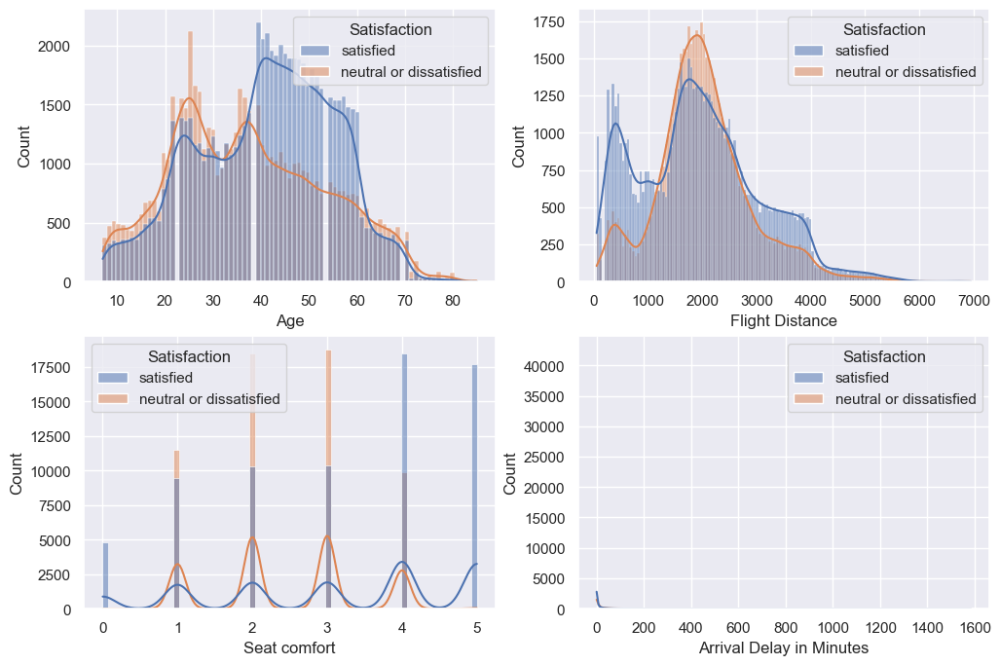

In [ ]:
fig, axs = plt.subplots(figsize=(12, 8))

# Plot variable 1
ax1 = plt.subplot(2,2,1)
sns.histplot(data=df, x="Age", hue="Satisfaction", kde=True)

# Plot variable 2
ax1 = plt.subplot(2,2,2)
sns.histplot(data=df, x="Flight Distance", hue="Satisfaction", kde=True)

# Plot variable 3
ax1 = plt.subplot(2,2,3)
sns.histplot(data=df, x="Seat comfort", hue="Satisfaction", kde=True)

# Plot variable 4
ax1 = plt.subplot(2,2,4)
sns.histplot(data=df, x="Arrival Delay in Minutes", hue="Satisfaction", kde=True)

(0.0, 30.0)

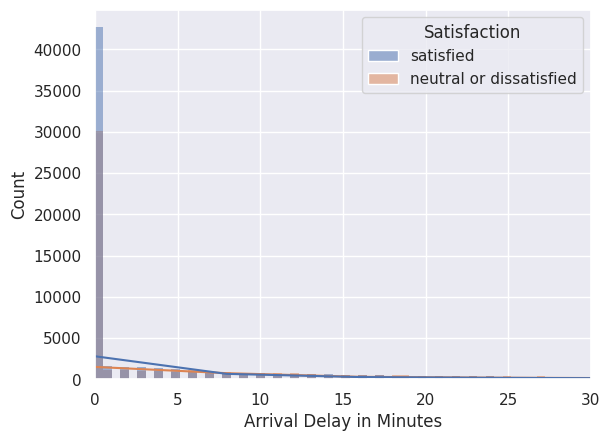

In [ ]:
sns.histplot(data=df, x="Arrival Delay in Minutes", hue="Satisfaction", kde=True)
plt.xlim(0, 30)

#### 3.3.4 Pairplot - Multiple features Vs Target

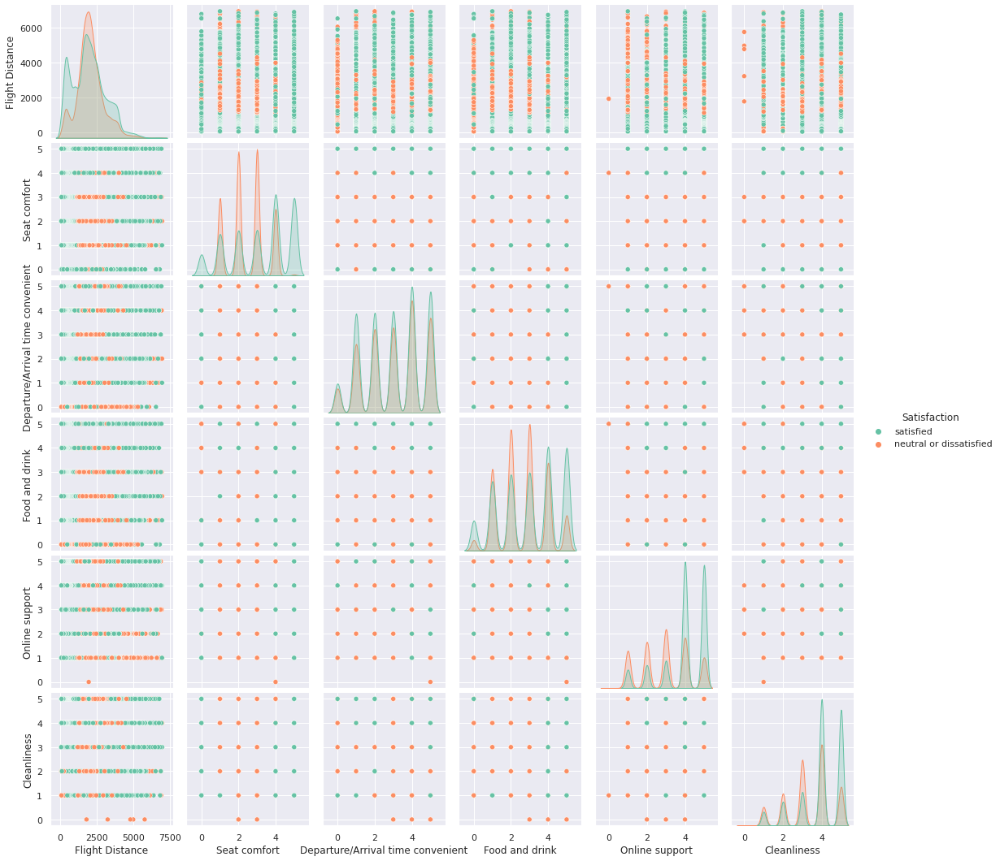

In [ ]:
selection_of_columns = ["Satisfaction", "Flight Distance", "Seat comfort", "Departure/Arrival time convenient", "Food and drink", "Online support", "Cleanliness"]
sns.pairplot(data=df[selection_of_columns], palette="Set2", diag_kind='kde', hue='Satisfaction')

#### 3.3.5 Conclusions

The above descriptions show some fruitful information :
- Numerical features such as `Age` and `Seat comfort` may have an effect on the passenger satisfaction.


### 3.4 Bivariate analysis - Categorical features

#### 3.4.1 Analysis

In [ ]:
pd.pivot_table(df.select_dtypes(include='object'),
               columns=['Satisfaction'],
               index=['Gender', 'Customer Type', 'Type of Travel', 'Class'],
               aggfunc=np.size)

Satisfaction                                       neutral or dissatisfied  \
Gender Customer Type     Type of Travel  Class                               
Female Loyal Customer    Business travel Business                  28040.0   
                                         Eco                       15520.0   
                                         Eco Plus                   5250.0   
                         Personal Travel Business                   1175.0   
                                         Eco                       13485.0   
                                         Eco Plus                   1920.0   
       disloyal Customer Business travel Business                  14420.0   
                                         Eco                       31315.0   
                                         Eco Plus                   3310.0   
                         Personal Travel Business                     35.0   
                                         Eco                         385.0   
Male   Loyal Customer    Business travel Business                  27350.0   
                                         Eco                       15525.0   
                                         Eco Plus                   5445.0   
                         Personal Travel Business                   5915.0   
                                         Eco                       73805.0   
                                         Eco Plus                  10135.0   
       disloyal Customer Business travel Business                  13360.0   
                                         Eco                       26270.0   
                                         Eco Plus                    880.0   
                         Personal Travel Business                     30.0   
                                         Eco                         375.0   
                                         Eco Plus                     20.0   

Satisfaction                                       satisfied  
Gender Customer Type     Type of Travel  Class                
Female Loyal Customer    Business travel Business    97850.0  
                                         Eco         14015.0  
                                         Eco Plus     4575.0  
                         Personal Travel Business     5405.0  
                                         Eco         68565.0  
                                         Eco Plus     9480.0  
       disloyal Customer Business travel Business     9390.0  
                                         Eco          4990.0  
                                         Eco Plus      295.0  
                         Personal Travel Business        NaN  
                                         Eco            75.0  
Male   Loyal Customer    Business travel Business    98105.0  
                                         Eco         14210.0  
                                         Eco Plus     4685.0  
                         Personal Travel Business      805.0  
                                         Eco          8250.0  
                                         Eco Plus      990.0  
       disloyal Customer Business travel Business     8920.0  
                                         Eco          4675.0  
                                         Eco Plus       70.0  
                         Personal Travel Business        NaN  
                                         Eco            85.0  
                                         Eco Plus        NaN

#### 3.4.2 Conclusions

The above descriptions show some fruitful information.
- Some combinations are over-represented (i.e higher rate) among the `satisfied` sentiment such as `Female - Loyal Customer -	Business travel -	Business` for example.
- Some combinations are over-represented (i.e higher rate) among the `dissatisfied` sentiment such as `Male - disloyal Customer -	Business travel -	Eco` for example.

Further statistical analysis may be done for a clear and better overview on the potential effects of categorical features on the passenger sentiment. See the [chi2_contingency()](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.chi2_contingency.html) method from `scipy.stats` for that purpose.


### 3.5 Multivariate Analysis

#### 3.5.1 Correlation matrix

<Axes: >

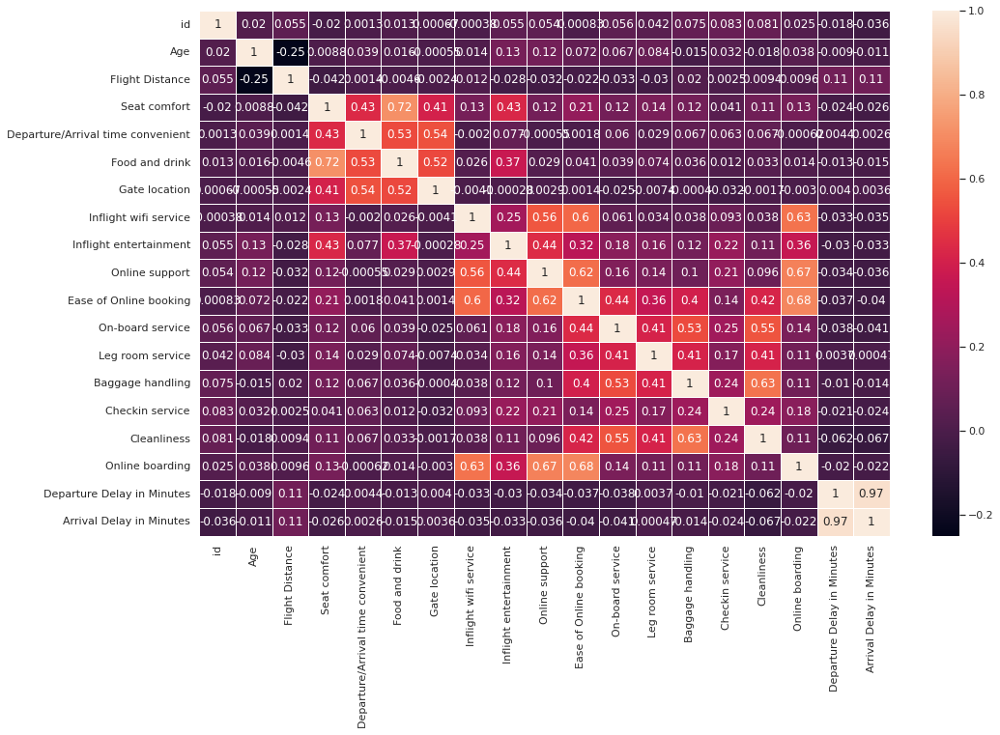

In [ ]:
plt.subplots(figsize=(16, 10))
sns.heatmap(df.corr(), annot=True, linewidths=0.5)

#### 3.5.2 PCA - Principal Component Analysis

In the `decomposition` sub-module, we will import the `PCA()` function. The PCA' operation is similar to all the others in scikit-learn.

* We first create an object (named here `pca`) which will contain the result of the PCA. In the `PCA()` function, we can also indicate parameters such as the number of components to retain (`n_components`).
* Then, we adjust (`fit`) on data with the `fit()` function of the previously created object. In this function, we must therefore pass the data to be used (only quantitative variables).
* If we want a standardized PCA, we have to standardize the data upstream, with for example the `scale()` function of the `preprocessing` sub-module (also imported here).

**Of course, only quantitative variables should be used, with no missing data.**

##### 3.5.2.1 Standardisation

In [ ]:
df_pca_prep = df.select_dtypes(exclude='object').drop(labels='id', axis=1).dropna()

df_scaled = scale(df_pca_prep)

Let's check the mean calculation, we expect all means to be closed to 0 after scaling.

In [ ]:
np.mean(df_scaled, axis=0)

array([-2.08958949e-16, -2.80953208e-17,  5.26787265e-17,  2.82050682e-17,
        8.77978776e-18,  1.19734356e-16, -1.15893198e-16,  1.40476604e-16,
        1.40476604e-17, -9.83336229e-17, -4.21429812e-17,  6.32144718e-17,
        3.51191510e-17, -4.91668114e-17,  1.40476604e-16, -2.31786397e-16,
       -8.77978776e-18,  7.46281959e-18])

Let's check the standard deviation calculation, we expect all standard deviations to be closed to 1 after scaling.

In [ ]:
np.std(df_scaled, axis=0)

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1.])

##### 3.5.2.2 PCA reduction
Here we create an object of the class PCA with fitting and data transformation.
The result is a array with the 4 dimensions coordinates of all data points.

In [ ]:
pca = PCA()
data_pca = pca.fit_transform(df_scaled)

# Or alternatively
#pca.fit(df_scaled)
#pca.transform(df_scaled)

In [ ]:
data_pca[:,0].shape

(129487,)

The `pca` object now includes a number of objects and functions, such as :
* The components  (`components_`)
* The table of explained variances (`explained_variance_` - proportional to the eigenvalues) by each dimension.
* The ratio (proportion) of variance explained by dimension (`explained_variance_ratio_`).
* and others ... (see [PCA documention](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html))

##### 3.5.2.3 Explained variance
The following instruction returns the variance explained by each of the PCA' dimension.

In [ ]:
pca.explained_variance_

array([3.92825921, 2.53958282, 2.13173393, 1.98444536, 1.26424227,
       1.00315952, 0.89000187, 0.75287972, 0.63269158, 0.48377087,
       0.46764553, 0.44032575, 0.36522505, 0.34100169, 0.30067873,
       0.2514061 , 0.18840443, 0.03468457])

But it's more understandable with the percentage of variance explained by each of the PCA' dimension.

In [ ]:
pca.explained_variance_ratio_

array([0.21823494, 0.14108685, 0.11842875, 0.11024611, 0.07023514,
       0.05573065, 0.04944417, 0.04182633, 0.03514926, 0.02687595,
       0.02598011, 0.02446235, 0.02029012, 0.01894439, 0.01670425,
       0.0139669 , 0.01046683, 0.00192691])

We may conclude that :
* First dimension explains 22% of variance,
* Second dimension explains 14% of variance,
* Third dimension explains 12% of variance,
* etc.

Let's resume this information in a structured data frame.

In [ ]:
df_variance = pd.DataFrame(
    {
        "Dimension" : ["Dim" + str(x + 1) for x in range(pca.explained_variance_ratio_.size)],
        "Explained variance" : pca.explained_variance_,
        "% of explained variance" : np.round(pca.explained_variance_ratio_ * 100),
        "Cumulated % of explained variance" : np.round(np.cumsum(pca.explained_variance_ratio_) * 100)
    }
)
df_variance.head(20)

,Dimension,Explained variance,% of explained variance,Cumulated % of explained variance
0,Dim1,3.928259,22.0,22.0
1,Dim2,2.539583,14.0,36.0
2,Dim3,2.131734,12.0,48.0
3,Dim4,1.984445,11.0,59.0
4,Dim5,1.264242,7.0,66.0
5,Dim6,1.003160,6.0,71.0
6,Dim7,0.890002,5.0,76.0
7,Dim8,0.752880,4.0,81.0
8,Dim9,0.632692,4.0,84.0
9,Dim10,0.483771,3.0,87.0


##### 3.5.2.4 Number of dimensions
And finally the choice of the number of dimensions may be done thanks to this plot, named **scree plot** (*graph des éboulis* in French).

<Axes: xlabel='Dimension'>

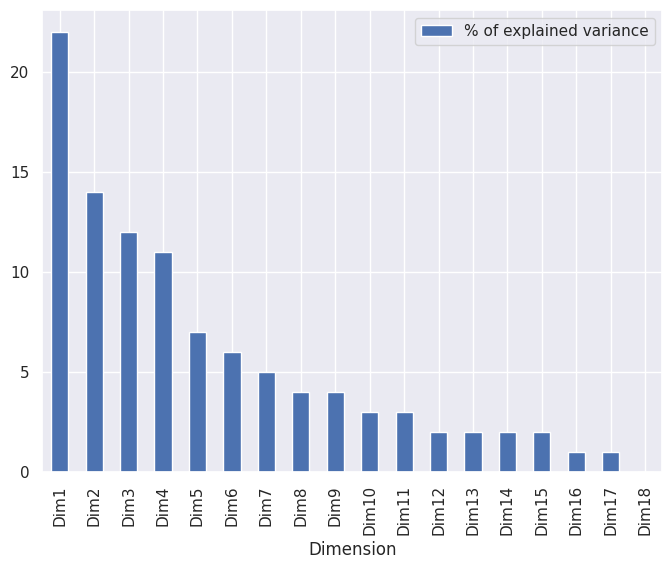

In [ ]:
df_variance.plot.bar(x = "Dimension", y = "% of explained variance", figsize=(8, 6))

We may conclude that 8 dimensions is enough to explained most of the global variance : the first 8 dimensions explain 81% of the global variance.

##### 3.5.2.5 Feature analysis
PCA made in an exploratory context (and not of compression) necessary needs to describe the axes from the variables, in order to understand what they represent.
For this, we should realize the circle of correlations.

In [ ]:
n = df_pca_prep.shape[0] # nb data points
p = df_pca_prep.shape[1] # nb features

eigval = (n-1) / n * pca.explained_variance_ # eigen values
sqrt_eigval = np.sqrt(eigval) # square root of eigen values
corvar = np.zeros((p,p)) # empty matrix

# loop for matrix filling
for k in range(p):
    corvar[:,k] = pca.components_[k,:] * sqrt_eigval[k]

# dataframe
coordvar = pd.DataFrame({'id': df_pca_prep.columns, 'COR_1': corvar[:,0], 'COR_2': corvar[:,1]})
coordvar

,id,COR_1,COR_2
0,Age,-0.119839,-0.000524
1,Flight Distance,0.044973,0.014223
2,Seat comfort,-0.450019,-0.699872
3,Departure/Arrival time convenient,-0.215689,-0.724633
4,Food and drink,-0.309322,-0.830364
5,Gate location,-0.146262,-0.728539
6,Inflight wifi service,-0.561448,0.191169
7,Inflight entertainment,-0.573710,-0.168606
8,Online support,-0.668893,0.206344
9,Ease of Online booking,-0.832396,0.251228


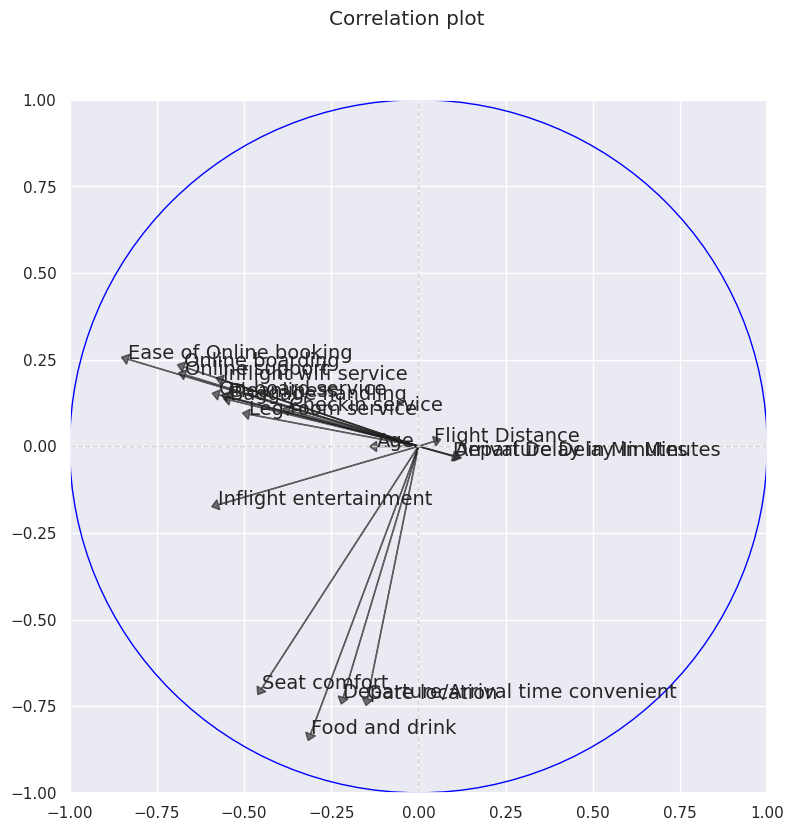

In [ ]:
# First plot with fixed coordinates (-1 and +1)
fig, axes = plt.subplots(figsize = (9,9))
fig.suptitle("Correlation plot")
axes.set_xlim(-1, 1)
axes.set_ylim(-1, 1)
axes.set_xlabel('1st Dimension (22%)')
axes.set_xlabel('2nd Dimension (14%)')

# Axis
axes.axvline(x = 0, color = 'lightgray', linestyle = '--', linewidth = 1)
axes.axhline(y = 0, color = 'lightgray', linestyle = '--', linewidth = 1)

# Names of features
for j in range(p):
    axes.text(x=coordvar["COR_1"][j], y=coordvar["COR_2"][j], s=coordvar["id"][j], fontsize=14)
    plt.arrow(0, 0, coordvar["COR_1"][j], coordvar["COR_2"][j], color = 'black', fc="k", ec="k", head_width=0.03, head_length=0.02, alpha = 0.6)

# Circle (0, 1)
plt.gca().add_artist(plt.Circle((0,0),1,color='blue',fill=False))
plt.show()

##### 3.5.2.6 Visual analysis
We are going to plot all data in 3D with the 3 main components.
As shown before the 3 main components cover about 50% of the global variance.

In [ ]:
# Prepare the convenient df
three_dim_df = pd.DataFrame({'Component_1': data_pca[:,0],
                            'Component_2': data_pca[:,1],
                            'Component_3': data_pca[:,2],
                            'Passenger sentimment': df.iloc[df_pca_prep.index.values]['Satisfaction']}) #Indexing on df_pca to keep the same row (dropna applied to df_pca)

In [ ]:
fig = px.scatter_3d(three_dim_df, x='Component_1', y='Component_2', z='Component_3',
              color='Passenger sentimment')
fig.show()

This plot shows that the 3 main components tend to provide distinction between the passenger sentiment.
However the ML algorithm should need more than 3 main components to build a clear and powerful classification of the passenger sentiment.

##### 3.5.2.7 PCA interpretation
From the last sections we may interprate the PCA' results as following :
* First dimension represents mostly the online and offline services of the flight.
* Second dimension represents mostly the pleasant aspect of the flight.

For a better and full understanding, further analysis may be done on the other principal dimensions.


## 4 Data preprocessing & Pipeline

### 4.1 Split Features `X` and Target `y` data

In [ ]:
y = df['Satisfaction']
X = df.drop(columns = ['Satisfaction', 'id'])

### 4.2 Categorical features

#### 4.2.1 Selection of columns

In [ ]:
column_cat = X.select_dtypes(include='object').columns
column_cat

Index(['Gender', 'Customer Type', 'Type of Travel', 'Class'], dtype='object')

#### 4.2.2 Pipeline for categorical features

In [ ]:
pipe_cat = Pipeline(steps=[
    ('imputation', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore', sparse = False))
])

### 4.3 Numerical features

#### 4.3.1 Numerical features
For those features, we set a specific pipeline with `RobustScaler`.

##### 4.3.1.1 Selection of columns

In [ ]:
column_num = ['Age', 'Flight Distance']

##### 4.3.1.2 Pipeline

In [ ]:
pipe_num = Pipeline(steps=[
    ('imputation', KNNImputer(n_neighbors=5, weights="uniform")),
    ('scaling', RobustScaler())
])

#### 4.3.2 Numerical features with transformation
For those features, we set a specific pipeline with `QuantileTransformer` to adjust their specific distribution.
More info [here](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.QuantileTransformer.html) about the QuantileTransformer.

##### 4.3.2.1 Selection of columns

In [ ]:
column_num_transf = ['Departure Delay in Minutes', 'Arrival Delay in Minutes']

##### 4.3.2.2 Pipeline

In [ ]:
pipe_num_transf = Pipeline(steps=[
    ('imputation', KNNImputer(n_neighbors=5, weights="uniform")),
    ('transform', QuantileTransformer(n_quantiles=30, output_distribution='normal', random_state=0))
])

#### 4.3.3 Numerical-ordinal features
For those features, we set a specific pipeline with `MinMaxSclaling`.

##### 4.3.3.1 Selection of columns

In [ ]:
column_num_ord = ['Seat comfort', 'Departure/Arrival time convenient', 'Food and drink',
       'Gate location', 'Inflight wifi service', 'Inflight entertainment',
       'Online support', 'Ease of Online booking', 'On-board service',
       'Leg room service', 'Baggage handling', 'Checkin service',
       'Cleanliness', 'Online boarding']

##### 4.3.3.2 Pipeline

In [ ]:
pipe_num_ord = Pipeline(steps=[
    ('imputation', KNNImputer(n_neighbors=5, weights="uniform")),
    ('scaling', MinMaxScaler())
])

### 4.4 Transformation of all features

#### 4.4.1 Build the full Pipeline

In [ ]:
preparation = ColumnTransformer(
    transformers=[
        ('data_cat', pipe_cat , column_cat),
        ('data_num', pipe_num , column_num),
        ('data_num_transf', pipe_num_transf , column_num_transf),
        ('data_num_ord', pipe_num_ord , column_num_ord)
    ])

In [ ]:
full_pipe = Pipeline(steps=[('preparation', preparation)])

In [ ]:
full_pipe

Pipeline(steps=[('preparation',
                 ColumnTransformer(transformers=[('data_cat',
                                                  Pipeline(steps=[('imputation',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 sparse=False))]),
                                                  Index(['Gender', 'Customer Type', 'Type of Travel', 'Class'], dtype='object')),
                                                 ('data_num',
                                                  Pipeline(steps=[('imputation',
                                                                   KNNImputer()),
                                                                  ('scaling',...
                                                 ('data_num_ord',
                                                  Pipeline(steps=[('imputation',
                                                                   KNNImputer()),
                                                                  ('scaling',
                                                                   MinMaxScaler())]),
                                                  ['Seat comfort',
                                                   'Departure/Arrival time '
                                                   'convenient',
                                                   'Food and drink',
                                                   'Gate location',
                                                   'Inflight wifi service',
                                                   'Inflight entertainment',
                                                   'Online support',
                                                   'Ease of Online booking',
                                                   'On-board service',
                                                   'Leg room service',
                                                   'Baggage handling',
                                                   'Checkin service',
                                                   'Cleanliness',
                                                   'Online boarding'])]))])

In [ ]:
set_config(display="diagram")
full_pipe

Pipeline(steps=[('preparation',
                 ColumnTransformer(transformers=[('data_cat',
                                                  Pipeline(steps=[('imputation',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 sparse=False))]),
                                                  Index(['Gender', 'Customer Type', 'Type of Travel', 'Class'], dtype='object')),
                                                 ('data_num',
                                                  Pipeline(steps=[('imputation',
                                                                   KNNImputer()),
                                                                  ('scaling',...
                                                 ('data_num_ord',
                                                  Pipeline(steps=[('imputation',
                                                                   KNNImputer()),
                                                                  ('scaling',
                                                                   MinMaxScaler())]),
                                                  ['Seat comfort',
                                                   'Departure/Arrival time '
                                                   'convenient',
                                                   'Food and drink',
                                                   'Gate location',
                                                   'Inflight wifi service',
                                                   'Inflight entertainment',
                                                   'Online support',
                                                   'Ease of Online booking',
                                                   'On-board service',
                                                   'Leg room service',
                                                   'Baggage handling',
                                                   'Checkin service',
                                                   'Cleanliness',
                                                   'Online boarding'])]))])

#### 4.4.2 Apply the full Pipeline
For inspection purpose only, we may apply the full pipeline on the features dataset and observe the transformed data.
Those data will serve the model for the next step, the training step.

In [ ]:
X_transf = pd.DataFrame(full_pipe.fit_transform(X),
                            columns = full_pipe.get_feature_names_out())
X_transf.head()

c:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


,data_cat__Gender_Female,data_cat__Gender_Male,data_cat__Customer Type_Loyal Customer,data_cat__Customer Type_disloyal Customer,data_cat__Type of Travel_Business travel,data_cat__Type of Travel_Personal Travel,data_cat__Class_Business,data_cat__Class_Eco,data_cat__Class_Eco Plus,data_num__Age,...,data_num_ord__Inflight wifi service,data_num_ord__Inflight entertainment,data_num_ord__Online support,data_num_ord__Ease of Online booking,data_num_ord__On-board service,data_num_ord__Leg room service,data_num_ord__Baggage handling,data_num_ord__Checkin service,data_num_ord__Cleanliness,data_num_ord__Online boarding
0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.041667,...,0.4,0.8,0.4,0.6,0.6,0.0,0.50,1.0,0.6,0.4
1,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.291667,...,0.0,0.4,0.4,0.6,0.8,0.8,0.75,0.4,0.6,0.4
2,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,-1.041667,...,0.4,0.0,0.4,0.4,0.6,0.6,0.75,0.8,0.8,0.4
3,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.833333,...,0.6,0.8,0.6,0.2,0.2,0.0,0.00,0.8,0.2,0.6
4,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.250000,...,0.8,0.6,0.8,0.4,0.4,0.0,0.25,0.8,0.4,1.0


### 4.5 Build the Pipeline function
For further usages we may prepare a function dedicated of pipeline building.

In [ ]:
def full_pipe(clf):

  # Categorical features
  pipe_cat = Pipeline(steps=[
    ('imputation', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore', sparse = False))
  ])

  # Numerical features
  pipe_num = Pipeline(steps=[
    ('imputation', KNNImputer(n_neighbors=5, weights="uniform")),
    ('scaling', RobustScaler())
  ])

  # Numerical features with prior transformation
  pipe_num_transf = Pipeline(steps=[
      ('imputation', KNNImputer(n_neighbors=5, weights="uniform")),
      ('transform', QuantileTransformer(n_quantiles=30, output_distribution='normal', random_state=0))
  ])

  # Numerical-ordianl features
  pipe_num_ord = Pipeline(steps=[
    ('imputation', KNNImputer(n_neighbors=5, weights="uniform")),
    ('scaling', MinMaxScaler())
  ])

  # Transformation
  preparation = ColumnTransformer(
    transformers=[
        ('data_cat', pipe_cat , X.select_dtypes(include='object').columns),
        ('data_num', pipe_num , ['Age', 'Flight Distance']),
        ('data_num_transf', pipe_num_transf , ['Departure Delay in Minutes', 'Arrival Delay in Minutes']),
        ('data_num_ord', pipe_num_ord , ['Seat comfort', 'Departure/Arrival time convenient', 'Food and drink', 'Gate location',
                                         'Inflight wifi service', 'Inflight entertainment', 'Online support', 'Ease of Online booking',
                                         'On-board service', 'Leg room service', 'Baggage handling', 'Checkin service',
                                         'Cleanliness', 'Online boarding'])
    ])

  # Final pipeline with transformation & model
  pipe = Pipeline(steps=[
       ('preparation', preparation),
       ('clf', clf)
       ])

  return(pipe)

### 4.6 Split data into train & test set

In the data description, we noticed that the `Satisfaction` target is slightly unbalanced.
So, we should adapt the train-test-split consequently by specifying the `stratify` parameter.

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42, stratify=y)

print(f'Shape of X train {X_train.shape} and y train {y_train.shape}')
print(f'Shape of X test {X_test.shape} and y test {y_test.shape}')

Shape of X train (97410, 22) and y train (97410,)
Shape of X test (32470, 22) and y test (32470,)


#### 4.5.1 Stratified split
Let's check that the stratify method worked properly.

In [ ]:
print(f'Class of `Satisfied` in y train :\n{y_train.value_counts(normalize=True)}')
print(f'Class of `Satisfied` in y test :\n{y_test.value_counts(normalize=True)}')

Class of `Satisfied` in y train :
satisfied                  0.547326
neutral or dissatisfied    0.452674
Name: Satisfaction, dtype: float64
Class of `Satisfied` in y test :
satisfied                  0.547336
neutral or dissatisfied    0.452664
Name: Satisfaction, dtype: float64


## 5 First model training


As a first and fast attempt, we are going to train a Naive Bayes classifie, available as  `GaussianNB()` model in sklearn (more info [here](https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.GaussianNB.html#)).

### 5.1 Model declaration

In [ ]:
clf = GaussianNB()

### 5.2 Model training

In [ ]:
model_nb = full_pipe(clf=clf).fit(X_train, y_train)
model_nb

c:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Pipeline(steps=[('preparation',
                 ColumnTransformer(transformers=[('data_cat',
                                                  Pipeline(steps=[('imputation',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 sparse=False))]),
                                                  Index(['Gender', 'Customer Type', 'Type of Travel', 'Class'], dtype='object')),
                                                 ('data_num',
                                                  Pipeline(steps=[('imputation',
                                                                   KNNImputer()),
                                                                  ('scaling',...
                                                  Pipeline(steps=[('imputation',
                                                                   KNNImputer()),
                                                                  ('scaling',
                                                                   MinMaxScaler())]),
                                                  ['Seat comfort',
                                                   'Departure/Arrival time '
                                                   'convenient',
                                                   'Food and drink',
                                                   'Gate location',
                                                   'Inflight wifi service',
                                                   'Inflight entertainment',
                                                   'Online support',
                                                   'Ease of Online booking',
                                                   'On-board service',
                                                   'Leg room service',
                                                   'Baggage handling',
                                                   'Checkin service',
                                                   'Cleanliness',
                                                   'Online boarding'])])),
                ('clf', GaussianNB())])

### 5.3 Prediction

In [ ]:
y_pred = model_nb.predict(X_test)
y_pred

array(['satisfied', 'satisfied', 'satisfied', ...,
       'neutral or dissatisfied', 'satisfied', 'satisfied'], dtype='<U23')

### 5.4 Evaluation

#### 5.4.1 Accuracy score
Performance of the model is here evaluates through the `accuracy score` [see sklearn documention](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.accuracy_score.html).

In [ ]:
score = accuracy_score(y_test, y_pred)
print("Performance of Gaussian NB - Accuracy score :", round(score, 5))

Performance of Gaussian NB - Accuracy score : 0.82387


#### 5.4.2 Confusion matrix
Distribution of true and false predictions are summarized through the `confusion matrix` [see sklearn documention](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.confusion_matrix.html).

In [ ]:
conf_matrix = confusion_matrix(y_true=y_test, y_pred=y_pred)
conf_matrix

array([[11963,  2735],
       [ 2984, 14788]], dtype=int64)

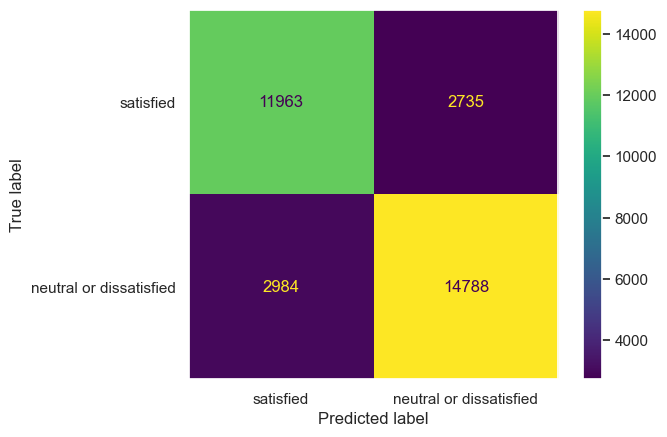

In [ ]:
sns.set_style("dark")

cm_plot = ConfusionMatrixDisplay(conf_matrix,
                                display_labels=df['Satisfaction'].unique())

cm_plot.plot()

#### 5.4.3 F1-score
Performance of the model is here evaluates through the `F1-score`, and can be interpreted as a harmonic mean of the precision and recall [see sklearn documention](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.f1_score.html).

In [ ]:
f1_score(y_true=y_test, y_pred=y_pred, average='weighted')

0.823986596722702

#### 5.4.4 Build the scoring function
For further usages we may prepare a function dedicated of pipeline building with a specific focus on the F1-score metric.

In [ ]:
def scoring_model(fitted_estimator, y_test):
  # Prediction
  y_pred = fitted_estimator.predict(X_test)

  # Accuracy
  accuracy = round(accuracy_score(y_test, y_pred), 4)

  # Confusion matrix
  conf_matrix = confusion_matrix(y_true=y_test, y_pred=y_pred)

  # F1-score
  f1score = f1_score(y_true=y_test, y_pred=y_pred, average='weighted')

  return({'prediction': y_pred,
          'accuracy': accuracy.round(4),
          'conf_matrix': conf_matrix,
          'f1_score': f1score.round(4)
   })

In [ ]:
# Test of the dedicated function

scoring_model(fitted_estimator=model_nb, y_test=y_test)

{'prediction': array(['satisfied', 'satisfied', 'satisfied', ...,
        'neutral or dissatisfied', 'satisfied', 'satisfied'], dtype='<U23'),
 'accuracy': 0.8239,
 'conf_matrix': array([[11963,  2735],
        [ 2984, 14788]], dtype=int64),
 'f1_score': 0.824}

#### 5.4.5 List of available metrics

In [ ]:
metrics.get_scorer_names()

['accuracy',
 'adjusted_mutual_info_score',
 'adjusted_rand_score',
 'average_precision',
 'balanced_accuracy',
 'completeness_score',
 'explained_variance',
 'f1',
 'f1_macro',
 'f1_micro',
 'f1_samples',
 'f1_weighted',
 'fowlkes_mallows_score',
 'homogeneity_score',
 'jaccard',
 'jaccard_macro',
 'jaccard_micro',
 'jaccard_samples',
 'jaccard_weighted',
 'matthews_corrcoef',
 'max_error',
 'mutual_info_score',
 'neg_brier_score',
 'neg_log_loss',
 'neg_mean_absolute_error',
 'neg_mean_absolute_percentage_error',
 'neg_mean_gamma_deviance',
 'neg_mean_poisson_deviance',
 'neg_mean_squared_error',
 'neg_mean_squared_log_error',
 'neg_median_absolute_error',
 'neg_negative_likelihood_ratio',
 'neg_root_mean_squared_error',
 'normalized_mutual_info_score',
 'positive_likelihood_ratio',
 'precision',
 'precision_macro',
 'precision_micro',
 'precision_samples',
 'precision_weighted',
 'r2',
 'rand_score',
 'recall',
 'recall_macro',
 'recall_micro',
 'recall_samples',
 'recall_weighted',

## 6 Cross Validation & Hyper-parameters tuning

Both cross validation & hyper-parameters tuning are handled with an sklearn experimental strategy `HalvingGridSearchCV()` that optimizes the hyper-parameters search compared to an exhaustive search such as `GridSearchCV()`.
More info [here](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.HalvingGridSearchCV.html#sklearn.model_selection.HalvingGridSearchCV) about the `HalvingGridSearchCV()` and [here](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html) about the `GridSearchCV()`.

### 6.1 A first and simple attempt

In [ ]:
# Model and its parameters
clf = GaussianNB()
parameters = {
    'clf__var_smoothing' : [1e-09, 1e-05]
}

# Scoring
# multi_scoring = {"AUC": "roc_auc", "Accuracy": make_scorer(accuracy_score)} # => not available with HalvingGridSearchCV

# HalvingGridSearch
grid = HalvingGridSearchCV(estimator = full_pipe(clf=clf), param_grid = parameters, scoring = 'f1_weighted', cv = 5, n_jobs =-1, verbose = 0)

# Fit
grid.fit(X_train, y_train)

# Scores
print(grid.best_score_)
print(grid.best_params_)

c:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


0.8231017095618846
{'clf__var_smoothing': 1e-05}


### 6.2 Build the function for Cross Validation & Hyper-parameters tuning
For further usages we may prepare a function dedicated of cross validation and optimized search of hyper-parameters.

In [ ]:
def crossval_paramsearch(X_train, y_train, estimator, parameters, search_mode='HalvingGridSearchCV', scoring='f1_weighted', cv=5):
  # Scoring
  # multi_scoring = {"AUC": "roc_auc", "Accuracy": make_scorer(accuracy_score)} # => not available with HalvingGridSearchCV

  if search_mode == 'HalvingGridSearchCV':
    # HalvingGridSearch
    grid = HalvingGridSearchCV(estimator=estimator, param_grid=parameters, scoring=scoring, cv=cv, n_jobs=-1, verbose=0)

  if search_mode == 'GridSearchCV':
    # GridSearch
    grid = GridSearchCV(estimator=estimator, param_grid=parameters, scoring=scoring, cv=cv, n_jobs=-1, verbose=0)

  # Fit
  grid.fit(X_train, y_train)

  # Scores and results
  best_score = grid.best_score_.round(4)
  best_params = grid.best_params_
  training_time = grid.cv_results_['mean_fit_time'].mean().round(4)

  # Output
  return({
      'classifier': clf,
      'best_score': best_score,
      'best_params': best_params,
      'training_time': training_time,
      'fitted_model': grid.best_estimator_
  })

Test of the previous function.

In [ ]:
# Model and its parameters
clf = GaussianNB()
parameters = {
    'clf__var_smoothing' : [1e-09, 1e-05]
}

crossval_paramsearch(X_train=X_train, y_train=y_train, estimator=full_pipe(clf=clf),
                     parameters=parameters, search_mode='HalvingGridSearchCV', scoring='f1_weighted', cv=5)

c:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


{'classifier': GaussianNB(),
 'best_score': 0.8231,
 'best_params': {'clf__var_smoothing': 1e-05},
 'training_time': 2.3965,
 'fitted_model': Pipeline(steps=[('preparation',
                  ColumnTransformer(transformers=[('data_cat',
                                                   Pipeline(steps=[('imputation',
                                                                    SimpleImputer(strategy='most_frequent')),
                                                                   ('onehot',
                                                                    OneHotEncoder(handle_unknown='ignore',
                                                                                  sparse=False))]),
                                                   Index(['Gender', 'Customer Type', 'Type of Travel', 'Class'], dtype='object')),
                                                  ('data_num',
                                                   Pipeline(steps=[('imputation',
          

## 7 Comparison of models
In this section we are going to test and compare a set of ML algorithms.

### 7.1 Build the function for comparison
To ease the process of models comparison, we may create a dedicated function `getClassifResults()`, based on previous ones :
- function `crossval_paramsearch()` for cross validation & hyper-paramaters tuning
- function `scoring_model()` for prediction and scoring.


This global function should be flexible and adaptative to a set of input parameters :
- `data`: the dataset for classification purpose
- `estimator` : the pipeline including both preprocessing and classification model
- `parameters` : a grid of hyper-parameters for grid search
- `search_mode`: the strategy for grid search, shoulb one of `HalvingGridSearchCV` or `GridSearchCV`
- `scoring` : the metric used for evaluation, `f1_weighted` is the default
- `cv` : the number of folds for cross validationn, `5` is the default

In [ ]:
def getClassifResults(data, estimator, parameters, search_mode='HalvingGridSearchCV', scoring='f1_weighted', cv=5):

  # Measuring time performance
  start = perf_counter()

  # Prepare data
  y = data['Satisfaction']
  X = data.drop(columns = ['Satisfaction', 'id'])

  # Split data
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42, stratify=y)

  # Cross Validation & Hyper-Paramaters tuning
  fitted_estimator = crossval_paramsearch(X_train=X_train, y_train=y_train, estimator=estimator,
                     parameters=parameters, search_mode=search_mode, scoring=scoring, cv=cv)

  # Prediction and scoring
  test_score = scoring_model(fitted_estimator=fitted_estimator['fitted_model'], y_test=y_test)

  # Measuring time performance
  end = perf_counter()
  execution_time = round((end - start), 2)
  print('Computing time (sec):', execution_time)

  return({'fitted_model': fitted_estimator,
          'test_score': test_score})

### 7.2 Naive Bayes classifier
Gaussian Naive Bayes as described in [sklearn](https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.GaussianNB.html#).

In [ ]:
# Model and its parameters
estimator = full_pipe(clf=GaussianNB())
parameters = {
    'clf__var_smoothing' : np.linspace(start=1e-10, stop=1, num=50)#{[1e-09, 1e-05]
}

# Results
NB_results = getClassifResults(data=df, estimator=estimator, parameters=parameters, search_mode='HalvingGridSearchCV', scoring='f1_weighted', cv=5)

print(f"Training time (sec): {NB_results['fitted_model']['training_time']} ")
print(f"Training score (F1): {NB_results['fitted_model']['best_score']} ")
print(f"Test score (F1): {NB_results['test_score']['f1_score']} ")

c:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Computing time (sec): 18.16
Training score (F1): 0.8231 
Test score (F1): 0.824 
Training time (sec): 0.1378 


### 7.3 Decision Tree classifier
Decision Tree Classifier as described in [sklearn](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html).

In [ ]:
# Model and its parameters
estimator = full_pipe(clf=DecisionTreeClassifier())
parameters = {
    'clf__criterion' : ('gini', 'entropy'),
    'clf__max_depth' : [10, 20, 30, None],
    'clf__min_samples_split' : [2, 3, 5, 7],
    'clf__min_samples_leaf' : [2, 3, 5, 7]
}

# Results
DT_results = getClassifResults(data=df, estimator=estimator, parameters=parameters, search_mode='HalvingGridSearchCV', scoring='f1_weighted', cv=5)

print(f"Training time (sec): {DT_results['fitted_model']['training_time']} ")
print(f"Training score (F1): {DT_results['fitted_model']['best_score']} ")
print(f"Test score (F1): {DT_results['test_score']['f1_score']} ")

c:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Computing time (sec): 28.47
Training score (F1): 0.9341 
Training time (sec): 0.0846 
Test score (F1): 0.9355 


### 7.4 Support Vector Machine for Classification
Support Vector Classifier as described in [sklearn](https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html#).

In [ ]:
# Model and its parameters
estimator = full_pipe(clf=SVC())
parameters = {
    #'clf__kernel': ('linear', 'rbf'),
    'clf__C' : [1, 3, 5, 7, 9],
    'clf__degree' : [2, 3, 4, 5]
}

# Results
SVM_results = getClassifResults(data=df, estimator=estimator, parameters=parameters, search_mode='HalvingGridSearchCV', scoring='f1_weighted', cv=5)

print(f"Training time (sec): {SVM_results['fitted_model']['training_time']} ")
print(f"Training score (F1): {SVM_results['fitted_model']['best_score']} ")
print(f"Test score (F1): {SVM_results['test_score']['f1_score']} ")

c:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Computing time (sec): 1061.37
Training score (F1): 0.9163 
Training time (sec): 42.2145 
Test score (F1): 0.9198 


### 7.5 KNeighborsClassifier
KNeighborsClassifier as described in [sklearn](https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html).

In [ ]:
# Model and its parameters
estimator = full_pipe(clf=KNeighborsClassifier())
parameters = {
    'clf__n_neighbors' : range(1, 10, 2),
    'clf__weights' : ['uniform', 'distance'],
    'clf__leaf_size' : range(10, 31, 5)
}

# Results
KNN_results = getClassifResults(data=df, estimator=estimator, parameters=parameters, search_mode='HalvingGridSearchCV', scoring='f1_weighted', cv=5)

print(f"Training time (sec): {KNN_results['fitted_model']['training_time']} ")
print(f"Training score (F1): {KNN_results['fitted_model']['best_score']} ")
print(f"Test score (F1): {KNN_results['test_score']['f1_score']} ")

c:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Computing time (sec): 91.65
Training time (sec): 0.1288 
Training score (F1): 0.9021 
Test score (F1): 0.903 


### 7.6 Random Forest Classifier
Random Forest Classifier as described in [sklearn](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html).

In [ ]:
# Model and its parameters
estimator = full_pipe(clf=RandomForestClassifier())
parameters = {
    'clf__n_estimators' : range(30, 111, 20),
    #'clf__criterion' : ('gini', 'entropy'),
    'clf__max_depth' : range(3, 11, 2),
    'clf__min_samples_split' : range(3, 11, 2),
    'clf__min_samples_leaf' : range(1, 11, 2)
}

# Results
RF_results = getClassifResults(data=df, estimator=estimator, parameters=parameters, search_mode='HalvingGridSearchCV', scoring='f1_weighted', cv=5)

print(f"Training time (sec): {RF_results['fitted_model']['training_time']} ")
print(f"Training score (F1): {RF_results['fitted_model']['best_score']} ")
print(f"Test score (F1): {RF_results['test_score']['f1_score']} ")

c:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Computing time (sec): 125.54
Training time (sec): 0.2318 
Training score (F1): 0.9267 
Test score (F1): 0.9279 


### 7.7 Gradient Boosting Classifier
Gradient Boosting Classifier as described in [sklearn](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingClassifier.html).

In [ ]:
# Model and its parameters
estimator = full_pipe(clf=GradientBoostingClassifier())
parameters = {
    'clf__learning_rate' : np.arange (start=0.1, stop=0.9, step=0.2),
    'clf__n_estimators' : range(30, 111, 20),
    'clf__max_depth' : range(3, 11, 2),
    'clf__min_samples_split' : range(3, 11, 2),
    'clf__min_samples_leaf' : range(1, 11, 2)
}

# Results
GB_results = getClassifResults(data=df, estimator=estimator, parameters=parameters, search_mode='HalvingGridSearchCV', scoring='f1_weighted', cv=5)

print(f"Training time (sec): {GB_results['fitted_model']['training_time']} ")
print(f"Training score (F1): {GB_results['fitted_model']['best_score']} ")
print(f"Test score (F1): {GB_results['test_score']['f1_score']} ")

c:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Computing time (sec): 453.91
Training time (sec): 0.4007 
Training score (F1): 0.9569 
Test score (F1): 0.9589 


### 7.8 Histogram-based Gradient Boosting Classifier
Histogram-based Gradient Boosting Classifier as described in [sklearn](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.HistGradientBoostingClassifier.html).

In [ ]:
# Model and its parameters
estimator = full_pipe(clf=HistGradientBoostingClassifier())
parameters = {
    'clf__max_iter' : ['binary_crossentropy', 'log_loss'],
    'clf__learning_rate' : np.arange (start=0.1, stop=0.9, step=0.2),
    'clf__max_iter' : range(50, 201, 50),
    'clf__min_samples_leaf' : range(5, 31, 5)
}

# Results
HGB_results = getClassifResults(data=df, estimator=estimator, parameters=parameters, search_mode='HalvingGridSearchCV', scoring='f1_weighted', cv=5)

print(f"Training time (sec): {HGB_results['fitted_model']['training_time']} ")
print(f"Training score (F1): {HGB_results['fitted_model']['best_score']} ")
print(f"Test score (F1): {HGB_results['test_score']['f1_score']} ")

c:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Computing time (sec): 55.34
Training time (sec): 0.7001 
Training score (F1): 0.957 
Test score (F1): 0.9597 


### 7.8 Conclusions
From previous fitted models we are going to build a dataframe with some specific metrics to ease the performance comparison.

In [ ]:
# Convenient function to extract main statistics from models and to prepare a dataframe
def extract_stats_from_model(model_results):
    training_score = model_results['fitted_model']['best_score']
    eval_score = model_results['test_score']['f1_score']
    training_time = model_results['fitted_model']['training_time']
    best_params = model_results['fitted_model']['best_params']

    return(list([training_score, eval_score, training_time, best_params]))

# Test the dedicated function
extract_stats_from_model(DT_results)

[0.9341,
 0.9355,
 0.0846,
 {'clf__criterion': 'entropy',
  'clf__max_depth': 10,
  'clf__min_samples_leaf': 5,
  'clf__min_samples_split': 7}]

In [ ]:
# Creation of the df
model_results_df = pd.DataFrame(extract_stats_from_model(NB_results),
                          index=['Training score (F1-score)', 'Evaluation score (F1-score)', 'Testing time (sec)', 'Best parameters'],
                          columns=['Naive Bayes'])

In [ ]:
# Store results into the df
model_results_df['SVM'] = extract_stats_from_model(SVM_results)
model_results_df['KNN'] = extract_stats_from_model(KNN_results)
model_results_df['Decision tree'] = extract_stats_from_model(DT_results)
model_results_df['Random Forest'] = extract_stats_from_model(RF_results)
model_results_df['Gradient Boosting'] = extract_stats_from_model(GB_results)
model_results_df['Hist Gradient Boosting'] = extract_stats_from_model(HGB_results)

# Transpose df for a better reading
model_results_df = model_results_df.T

In [ ]:
model_results_df

,Training score (F1-score),Evaluation score (F1-score),Testing time (sec),Best parameters
Naive Bayes,0.8231,0.824,0.1378,{'clf__var_smoothing': 1e-10}
SVM,0.9163,0.9198,42.2145,"{'clf__C': 9, 'clf__degree': 3}"
KNN,0.9021,0.903,0.1288,"{'clf__leaf_size': 10, 'clf__n_neighbors': 9, ..."
Decision tree,0.9341,0.9355,0.0846,"{'clf__criterion': 'entropy', 'clf__max_depth'..."
Random Forest,0.9267,0.9279,0.2318,"{'clf__max_depth': 9, 'clf__min_samples_leaf':..."
Gradient Boosting,0.9569,0.9589,0.4007,"{'clf__learning_rate': 0.30000000000000004, 'c..."
Hist Gradient Boosting,0.957,0.9597,0.7001,"{'clf__learning_rate': 0.30000000000000004, 'c..."


**Model selection**
All classifiers provide pretty good performances for prediction of the passenger sentiment.
Our choice is lead by :
- High F1-score on both train and test data, that means no overfitting.
- Low or acceptable training time.

**So the `Histogram-based Gradient Boosting Classifier` is the final model we decide to select (and deploy if necessary).**

*Notice* :
The fitted estimator previously selected is already store and available here (new fitting is not necessary) :

In [ ]:
print(HGB_results['fitted_model']['fitted_model'])

Pipeline(steps=[('preparation',
                 ColumnTransformer(transformers=[('data_cat',
                                                  Pipeline(steps=[('imputation',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 sparse=False))]),
                                                  Index(['Gender', 'Customer Type', 'Type of Travel', 'Class'], dtype='object')),
                                                 ('data_num',
                                                  Pipeline(steps=[('imputation',
                                                                   KNNImputer()),
                                                                  ('scaling',..

## 8 Feature importance / Feature selection
At this stage it seems interesting to focus on the features and evaluate their contribution (`importance`) in the construction of the model.
In this example, let's take the model previously selected :
* Classifier `HistGradientBoostingClassifier()`
* Hyper-parameters (`best.params_`) : `{'clf__learning_rate': 0.3, 'clf__max_iter': 100, 'clf__min_samples_leaf': 25}`


In [ ]:
#forest = RFC_model.best_estimator_.named_steps['model'] # récupération du modèle depuis le grid
#feature_names = RFC_model.best_estimator_.named_steps['preparation'].get_feature_names_out()  # récupération des feature names
feature_names = selected_pipeline.named_steps['preparation'].get_feature_names_out()
print(feature_names)

importance = selected_pipeline.named_steps['clf'].feature_importances_
print(importance)

['data_cat__Gender_Female' 'data_cat__Gender_Male'
 'data_cat__Customer Type_Loyal Customer'
 'data_cat__Customer Type_disloyal Customer'
 'data_cat__Type of Travel_Business travel'
 'data_cat__Type of Travel_Personal Travel' 'data_cat__Class_Business'
 'data_cat__Class_Eco' 'data_cat__Class_Eco Plus' 'data_num__Age'
 'data_num__Flight Distance' 'data_num_transf__Departure Delay in Minutes'
 'data_num_transf__Arrival Delay in Minutes' 'data_num_ord__Seat comfort'
 'data_num_ord__Departure/Arrival time convenient'
 'data_num_ord__Food and drink' 'data_num_ord__Gate location'
 'data_num_ord__Inflight wifi service'
 'data_num_ord__Inflight entertainment' 'data_num_ord__Online support'
 'data_num_ord__Ease of Online booking' 'data_num_ord__On-board service'
 'data_num_ord__Leg room service' 'data_num_ord__Baggage handling'
 'data_num_ord__Checkin service' 'data_num_ord__Cleanliness'
 'data_num_ord__Online boarding']
[5.96902643e-03 1.17477301e-02 2.75554706e-02 1.36835587e-02
 1.92220700e-

### 8.1 Retrieve the pipeline
Data related to the feature importance are stored in the `Pipeline()` object.
So let's relative the needed information from the pipeline of the previously selected model.

In [ ]:
selected_pipeline = GB_results['fitted_model']['fitted_model']
selected_pipeline

Pipeline(steps=[('preparation',
                 ColumnTransformer(transformers=[('data_cat',
                                                  Pipeline(steps=[('imputation',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 sparse=False))]),
                                                  Index(['Gender', 'Customer Type', 'Type of Travel', 'Class'], dtype='object')),
                                                 ('data_num',
                                                  Pipeline(steps=[('imputation',
                                                                   KNNImputer()),
                                                                  ('scaling',...
                                                   'Food and drink',
                                                   'Gate location',
                                                   'Inflight wifi service',
                                                   'Inflight entertainment',
                                                   'Online support',
                                                   'Ease of Online booking',
                                                   'On-board service',
                                                   'Leg room service',
                                                   'Baggage handling',
                                                   'Checkin service',
                                                   'Cleanliness',
                                                   'Online boarding'])])),
                ('clf',
                 GradientBoostingClassifier(learning_rate=0.30000000000000004,
                                            max_depth=9, min_samples_leaf=3,
                                            min_samples_split=9,
                                            n_estimators=70))])

### 8.2 Extracting feature names

All feature names (i.e. numerical, ordinal, etc.) listed within the pipeline are available as following.

In [ ]:
feature_names = selected_pipeline.named_steps['preparation'].get_feature_names_out()
print(feature_names)

['data_cat__Gender_Female' 'data_cat__Gender_Male'
 'data_cat__Customer Type_Loyal Customer'
 'data_cat__Customer Type_disloyal Customer'
 'data_cat__Type of Travel_Business travel'
 'data_cat__Type of Travel_Personal Travel' 'data_cat__Class_Business'
 'data_cat__Class_Eco' 'data_cat__Class_Eco Plus' 'data_num__Age'
 'data_num__Flight Distance' 'data_num_transf__Departure Delay in Minutes'
 'data_num_transf__Arrival Delay in Minutes' 'data_num_ord__Seat comfort'
 'data_num_ord__Departure/Arrival time convenient'
 'data_num_ord__Food and drink' 'data_num_ord__Gate location'
 'data_num_ord__Inflight wifi service'
 'data_num_ord__Inflight entertainment' 'data_num_ord__Online support'
 'data_num_ord__Ease of Online booking' 'data_num_ord__On-board service'
 'data_num_ord__Leg room service' 'data_num_ord__Baggage handling'
 'data_num_ord__Checkin service' 'data_num_ord__Cleanliness'
 'data_num_ord__Online boarding']


### 8.3 Extracting feature importanceon de la contribution des features
All feature importances (i.e. relative contribution) are available as following.

In [ ]:
feature_importances = selected_pipeline.named_steps['clf'].feature_importances_
feature_importances

array([5.96902643e-03, 1.17477301e-02, 2.75554706e-02, 1.36835587e-02,
       1.92220700e-02, 1.36004473e-02, 2.35951523e-02, 5.19087136e-04,
       3.84373434e-04, 1.50257752e-02, 1.53518680e-02, 3.70622780e-03,
       9.72828344e-03, 1.96816882e-01, 1.93971687e-02, 1.12555158e-02,
       2.00467800e-02, 4.37534906e-03, 4.22223162e-01, 1.77687893e-02,
       6.79626864e-02, 8.60949098e-03, 1.67129603e-02, 1.32897562e-02,
       1.94914923e-02, 1.16260628e-02, 1.03348341e-02])

### 8.4 Graphical analysis

In [ ]:
df_importance = pd.DataFrame({'Feature names': feature_names, 'Feature importance': feature_importances})
df_importance = df_importance.sort_values(by='Feature importance', ascending=False)

df_importance

,Feature names,Feature importance
18,data_num_ord__Inflight entertainment,0.422223
13,data_num_ord__Seat comfort,0.196817
20,data_num_ord__Ease of Online booking,0.067963
2,data_cat__Customer Type_Loyal Customer,0.027555
6,data_cat__Class_Business,0.023595
16,data_num_ord__Gate location,0.020047
24,data_num_ord__Checkin service,0.019491
14,data_num_ord__Departure/Arrival time convenient,0.019397
4,data_cat__Type of Travel_Business travel,0.019222
19,data_num_ord__Online support,0.017769


<Axes: xlabel='Feature importance', ylabel='Feature names'>

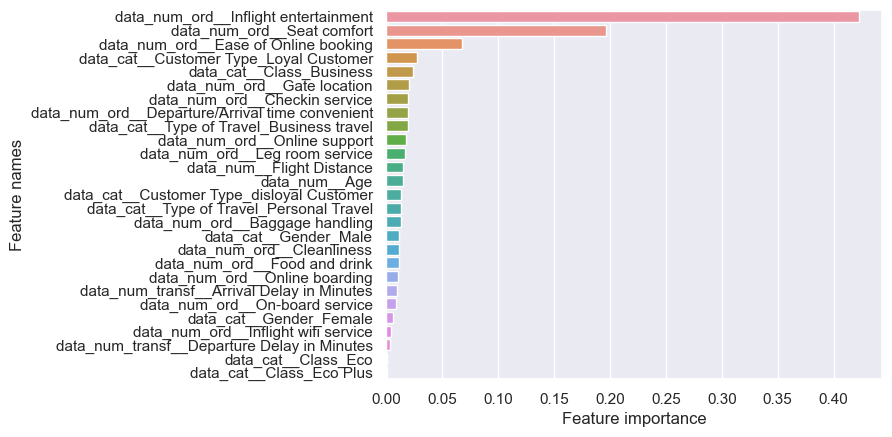

In [ ]:
sns.barplot(data = df_importance, x='Feature importance', y='Feature names')

## 9 Conclusions

This study achieved a full analysis on a use case of Supervised Learning with :
- EDA - Exploratory Data Analysis, including PCA
- Data preprocessing & Pipeline
- Model training & GridSearchCV
- Extensive search of hyperparameters
- Use of dedicated classification metrics
- Comparison & Selection of a set of models
- Feature importance